<a href="https://colab.research.google.com/github/Rocknroll-nerd/statistic/blob/main/LSTM_wiki_plots.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook is for ML model, which creates movie's annotations on the base of existing ones

dataset – https://www.kaggle.com/rounakbanik/the-movies-dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:

import numpy as np
import pandas as pd 
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM
from keras.utils import np_utils
from keras.callbacks import ModelCheckpoint, Callback
import tensorflow as tf
from tensorflow.keras.layers.experimental import preprocessing
from keras.losses import BinaryCrossentropy

%matplotlib inline
from IPython.display import Image, HTML

import ast

import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from numpy.random import shuffle


from wordcloud import WordCloud, STOPWORDS
import plotly
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import warnings
warnings.filterwarnings('ignore')



#sns.set_style('whitegrid')
#sns.set(font_scale=1.25)
pd.set_option('display.max_colwidth', 50)
plt.style.use('ggplot')

#Wikipedia plots tokenizing

Датасет со сценариями с википедии

In [ ]:
!unzip /content/drive/MyDrive/datasets/wikiplots.zip

Archive:  /content/drive/MyDrive/datasets/wikiplots.zip
  inflating: wiki_movie_plots_deduped.csv  


In [ ]:
df = pd.read_csv("wiki_movie_plots_deduped.csv")
df.head(5)

,Release Year,Title,Origin/Ethnicity,Director,Cast,Genre,Wiki Page,Plot
0,1901,Kansas Saloon Smashers,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Kansas_Saloon_Sm...,"A bartender is working at a saloon, serving dr..."
1,1901,Love by the Light of the Moon,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/Love_by_the_Ligh...,"The moon, painted with a smiling face hangs ov..."
2,1901,The Martyred Presidents,American,Unknown,NaN,unknown,https://en.wikipedia.org/wiki/The_Martyred_Pre...,"The film, just over a minute long, is composed..."
3,1901,"Terrible Teddy, the Grizzly King",American,Unknown,NaN,unknown,"https://en.wikipedia.org/wiki/Terrible_Teddy,_...",Lasting just 61 seconds and consisting of two ...
4,1902,Jack and the Beanstalk,American,"George S. Fleming, Edwin S. Porter",NaN,unknown,https://en.wikipedia.org/wiki/Jack_and_the_Bea...,The earliest known adaptation of the classic f...


In [ ]:
unique_genre = np.unique(df['Genre'])
unique_genre.shape, unique_genre[:10] #грустно

((2265,),
 array([' ', ' usa ', ' usa, can ', '-', '16\xa0mm film', '[140]', '[144]',
        'action', 'action ', 'action & comedy'], dtype=object))

In [ ]:
final_df = df.loc[:, df.columns.intersection(['Title', 'Genre', 'Plot'])]

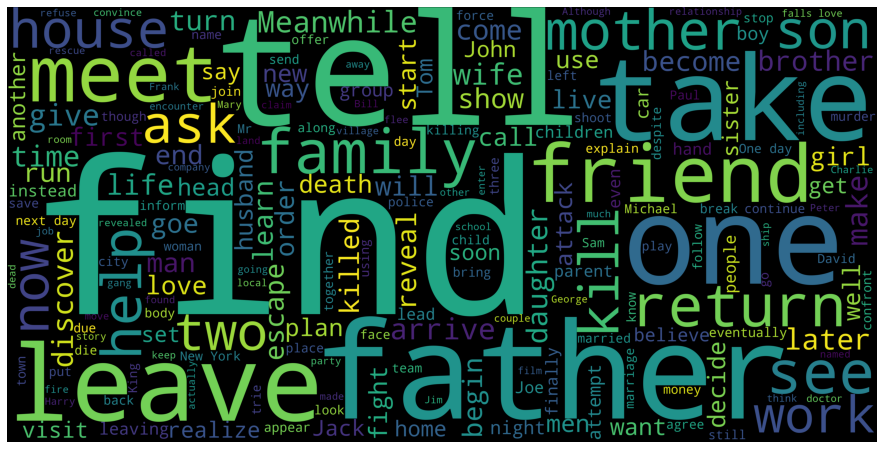

In [ ]:

final_df['Plot'] = final_df['Plot'].astype('str')
plot_corpus = ' '.join(final_df['Plot'])

plot_wc = WordCloud(stopwords=STOPWORDS, height=2000, width=4000).generate(plot_corpus)
plt.figure(figsize=(16,8))
plt.imshow(plot_wc)
plt.axis('off')
plt.show()


#Убираем ненужные символы в тексте, готовим для обучения


In [ ]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

здесь почищенные сценарии, без стопслов запятых  и больших букв

после получения результата решила перемешать сценарии, поскольку сценарии в порядке года выпуска, язык за 100 лет мог немного измениться

In [ ]:
z = final_df['Plot'].str.lower()[:1]
z[0]

"a bartender is working at a saloon, serving drinks to customers. after he fills a stereotypically irish man's bucket with beer, carrie nation and her followers burst inside. they assault the irish man, pulling his hat over his eyes and then dumping the beer over his head. the group then begin wrecking the bar, smashing the fixtures, mirrors, and breaking the cash register. the bartender then sprays seltzer water in nation's face before a group of policemen appear and order everybody to leave.[1]"

In [ ]:
def SplitData(data=final_df, colname='Plot', val_col='overview', n_rows=100, lower=True, non_punctuation=True, stop_words=True):
  train = data[colname].copy()
  train.reset_index(inplace=True, drop = True)
  shuffle(train)
  train = train[:n_rows]
  if lower:
    train.str.lower()
  if non_punctuation:
    train.str.replace('[^a-zA-Z]',' ')
  if stop_words:
    stop_re = '\\b'+'\\b|\\b'.join(nltk.corpus.stopwords.words('english'))+'\\b'
    train.str.replace(stop_re, '')
    
  new_train = np.zeros_like(train)
  for  i in range(n_rows):
    new_train[i] = RegexpTokenizer(r'\w+').tokenize(train[i])
    " ".join(new_train[i])
  #new_train = [val for sublist in new_train for val in sublist]
  
  return new_train

In [ ]:
#plotsTok = [nltk.word_tokenize(plot) for plot in input]

In [ ]:
train= SplitData()

In [ ]:
train[0][1]

'the'

In [ ]:
train.shape

(100,)

#Превращаю буквы в цифры


пока что работаю только с train словариком

In [ ]:
len(train[0]), len(train[20])

(256, 913)

In [ ]:
#text = np.concatenate((train,test), axis=None)
#избавляюсь от  nested array 
text = [val for sublist in train for val in sublist]
#text[1]

In [ ]:
#цифра соответствует слову
chars = sorted(list(set(text))) 
char_to_num = dict((c, i) for i, c in enumerate(chars))

In [ ]:
input_len = len(text)
vocab_len = len(chars)
print ("Total number of characters:", input_len)
print ("Total vocab:", vocab_len)

Total number of characters: 37538
Total vocab: 6938


In [ ]:
def cheek2cheek(seq_length=100, text=text, chars=chars, char_to_num=char_to_num):
  x_data = []
  y_data = []
  for i in range(0, len(text) - seq_length, 1):
    
    in_seq = text[i:i + seq_length]

    
    out_seq = text[i + seq_length]

    
    x_data.append([char_to_num[char] for char in in_seq])
    y_data.append(char_to_num[out_seq])
  return x_data, y_data


In [ ]:
x_data, y_data = cheek2cheek()

In [ ]:
x_data[1][1], y_data[0]

(4755, 107)

In [ ]:
X = np.reshape(x_data, (len(x_data), 100, 1))
X = X/float(vocab_len)

In [ ]:
#one_hot_encode
y = np_utils.to_categorical(y_data)

In [ ]:
y[0].shape

(6938,)

#LSTM_1

In [ ]:
#модель LSTM
def LSTM_plot(X =X, y= y):
    model = Sequential()
    model.add(LSTM(256, input_shape=(X.shape[1], X.shape[2]), return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(256, return_sequences=True))
    model.add(Dropout(0.2))
    model.add(LSTM(128))
    model.add(Dropout(0.2))
    model.add(Dense(y.shape[1], activation='softmax'))
    return model

In [ ]:
model = LSTM_plot()
model.compile(loss='categorical_crossentropy', optimizer='adam')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 100, 256)          264192    
_________________________________________________________________
dropout (Dropout)            (None, 100, 256)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 100, 256)          525312    
_________________________________________________________________
dropout_1 (Dropout)          (None, 100, 256)          0         
_________________________________________________________________
lstm_2 (LSTM)                (None, 128)               197120    
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense (Dense)                (None, 6938)              8

In [ ]:
#я обязательно запихаю ее в колбек
def RandomForCallback(x_data=x_data):
    start = np.random.randint(0, len(x_data) - 1)
    pattern = x_data[start]
    return "\"", ''.join([num_to_char[value] for value in pattern]), "\""

In [ ]:
#и ее
filepath = "model_weights_saved.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
desired_callbacks = [checkpoint]

In [ ]:
class PrintKernelCallback(Callback):
  def __init__(self, model):
    self.model = model
    
  
  def on_epoch_end(self, epoch, logs={}):
   #  y_pred = print random generated text 
    #print('prediction: {} at epoch: {}'.format(y_pred, epoch))


In [ ]:
model.fit(X, y, epochs=4, batch_size=256, callbacks=desired_callbacks)

Epoch 1/4
147/147 [==============================] - 57s 162ms/step - loss: 7.7098

Epoch 00001: loss improved from inf to 7.39893, saving model to model_weights_saved.hdf5
Epoch 2/4
147/147 [==============================] - 24s 162ms/step - loss: 7.0201

Epoch 00002: loss improved from 7.39893 to 7.04736, saving model to model_weights_saved.hdf5
Epoch 3/4
147/147 [==============================] - 24s 162ms/step - loss: 7.0191

Epoch 00003: loss improved from 7.04736 to 7.01103, saving model to model_weights_saved.hdf5
Epoch 4/4
147/147 [==============================] - 24s 162ms/step - loss: 6.9858

Epoch 00004: loss improved from 7.01103 to 6.99993, saving model to model_weights_saved.hdf5


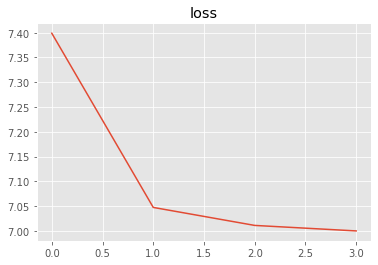

In [ ]:
plt.plot(model.history.history['loss'])
#plt.plot(model.history.history['val_accuracy'])
plt.title('loss')

plt.show()


In [ ]:
num_to_char = dict((i, c) for i, c in enumerate(chars))

In [ ]:
start = np.random.randint(0, len(x_data) - 1)
pattern = x_data[start]

In [ ]:
import sys

In [ ]:
for i in range(20):
	x = np.reshape(pattern, (1, len(pattern), 1))
	x = x / float(len(chars))
	prediction = model.predict(x, verbose=0)
	index = np.argmax(prediction)
	result = num_to_char[index]
	seq_in = [num_to_char[value] for value in pattern]
	sys.stdout.write(result)
	pattern.append(index)
	pattern = pattern[1:len(pattern)]


thethethethethethethethethethethethethethethethethethethethe

In [ ]:
result

'the'

In [ ]:
trained =  ' '.join([num_to_char[value] for value in pattern])
overview = final_df['Plot'][np.random.randint(0, final_df['Plot'].shape)].values
print(trained, '\n','\n', overview)

aman recollects evil spirit caused car accident aman suggested destroy spirit bemused professor laughs urges aman forget kaya move aman friend shubh disappointed aman persistent looks professors work retrieves dangerous chase evil spirit cursed book library convinced aman determined capable professor agrees help first stop abandoned cinema professor explains haunted several spirits noble spirits may able help locate evil curse keeper aman kaya enter theatre surrounded spirits one splatters drops blood kaya wrists professor interprets drops co ordinates ancient kingdom magha present day mahipalpur arrive mahipalpur settle decrepit government guest house evil spirit relentless attacks kaya tries bury alive save 
 
 ["The movie opens in an engineering college in Ooty with a narration by Rajesh Shivkumar (R. Madhavan). Rajiv Samuel (Abbas) is a computer engineering student and is one of the top students in the college, whereas Rajesh is a mechanical engineering student who is the bad guy o

если датасет не шафлить, то аутпут будет такой

In [ ]:
pattern = x_data[14]
' '.join([num_to_char[value] for value in pattern])

'blind bitter resents potential lady bountiful attempt become patron saint next time club bandleader chick morgan hoagy carmichael informs dan quit cathy arranges meet public beach coincidence introduces mary willey woman limited means also blind strike relationship dan explains lost sight another driver car crash going great lengths continue ruse longtime companion mrs willey rent inexpensive apartment dan persuaded resume writing piano concerto cathy sponsors prize contest without telling confident dan music win performed carnegie hall famed pianist artur rubinstein dan uses money undergo operation new york restores vision contest discovers cathy provided prize money still idea also mary well'

#Если ничего не чистить то будет так

In [ ]:
x_new = SplitData(lower = False, non_punctuation=False, stop_words=False, n_rows=100)

In [ ]:
text = [val for sublist in x_new for val in sublist]

In [ ]:
chars = sorted(list(set(text))) 
char_to_num = dict((c, i) for i, c in enumerate(chars))

In [ ]:
char_to_num.keys()

dict_keys(['000', '1', '10', '118', '13', '14th', '15', '16', '18', '1812', '1860', '19', '1928', '1932', '1936', '1937', '1945', '1947', '1950s', '1955', '1970s', '1975', '1980', '1986', '1988', '1989', '1990s', '2', '200', '2009', '20s', '20th', '21', '22', '25', '3', '30', '300', '30s', '31', '31st', '33rd', '360', '4', '5', '50', '50s', '62', '70', '70s', '8', '9', '9th', 'A', 'AC', 'ACP', 'AWOL', 'Aaaiiigh', 'Aadukalam', 'Aamir', 'Aboard', 'Abydos', 'Academy', 'Acqui', 'Across', 'Adam', 'Adelheid', 'Adi', 'Aditya', 'Adler', 'Admiral', 'African', 'After', 'Afterward', 'Again', 'Agent', 'Agents', 'Air', 'Aitkens', 'Ajatshatru', 'Ajax', 'Ajay', 'Akash', 'Akbar', 'Akira', 'Akshaye', 'Al', 'Alan', 'Albert', 'Alby', 'Alex', 'Alia', 'Alice', 'Alistair', 'All', 'Allan', 'Allies', 'Allister', 'Allowing', 'Alm', 'Along', 'Alps', 'Also', 'Although', 'Aman', 'Amanda', 'Ambika', 'Amelia', 'America', 'American', 'Americans', 'Amidst', 'Amita', 'Ammaji', 'Among', 'Amrish', 'An', 'Ancient', 'And'

In [ ]:
len(text), len(char_to_num)

(36932, 7010)

In [ ]:
vl = len(chars)

In [ ]:
x_data_batch, y_data_batch = cheek2cheek()

In [ ]:
X = np.reshape(x_data_batch, (len(x_data_batch), 100, 1))/float(vl)
y = np_utils.to_categorical(y_data_batch)

In [ ]:
X.shape

(37438, 100, 1)

#эксперимент

In [ ]:
model.fit(X, y, epochs=4, batch_size=128, callbacks=desired_callbacks)

Epoch 1/4
293/293 [==============================] - 32s 109ms/step - loss: 7.0210

Epoch 00001: loss did not improve from 6.99993
Epoch 2/4
293/293 [==============================] - 32s 109ms/step - loss: 6.9955

Epoch 00002: loss improved from 6.99993 to 6.99552, saving model to model_weights_saved.hdf5
Epoch 3/4
293/293 [==============================] - 32s 109ms/step - loss: 6.9838

Epoch 00003: loss improved from 6.99552 to 6.98379, saving model to model_weights_saved.hdf5
Epoch 4/4
293/293 [==============================] - 32s 109ms/step - loss: 6.9778

Epoch 00004: loss improved from 6.98379 to 6.97779, saving model to model_weights_saved.hdf5


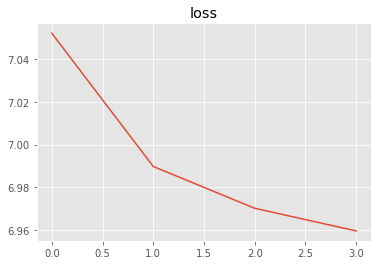

In [ ]:
plt.plot(model.history.history['loss'])
#plt.plot(model.history.history['val_accuracy'])
plt.title('loss')

plt.show()

In [ ]:
num_to_char = dict((i, c) for i, c in enumerate(chars))

In [ ]:
start = np.random.randint(0, len(x_batch) - 1)
pattern = x_data_batch[start]
' '.join([num_to_char[value] for value in pattern])

'an apartment that becomes their love nest but leave his marriage intact Things get complicated when Dinah gets pregnant She decides to leave London with her friend Bridie and await the birth and Rickie s arrival in the south of England During a snowstorm Dinah gives birth to a stillborn daughter and almost dies from blood loss due to complications during the birth Rickie on his way to reach her suffers a car accident and arrives too late Grief stricken Dinah turns Rickie away and ends their affair Rickie becomes lost in despair but tries to hide it unsuccessfully from'

#Минибатчи и tf


In [ ]:
with open('wiki_movie_plots_deduped.csv') as f:
    print(f)

<_io.TextIOWrapper name='wiki_movie_plots_deduped.csv' mode='r' encoding='UTF-8'>


In [ ]:
x_new = SplitData(lower = True, non_punctuation=True, stop_words=False, n_rows=400)
text = [val for sublist in x_new for val in sublist]

In [ ]:
print(f'Length of text: {len(text)} characters')

Length of text: 156767 characters


In [ ]:
tf_token = tf.strings.unicode_split(text, input_encoding='UTF-8')
tf_token

<tf.RaggedTensor [[b'P', b'a', b'r', b's', b'i', b'f', b'a', b'l'], [b'K', b'a', b't', b'z', b'e', b'n', b'e', b'l', b'l', b'e', b'n', b'b', b'o', b'g', b'e', b'n'], [b'T', b'o', b'n', b'y'], [b'C', b'u', b'r', b't', b'i', b's'], [b'i', b's'], [b'a', b'n'], [b'e', b'c', b'c', b'e', b'n', b't', b'r', b'i', b'c'], [b'h', b'y', b'p', b'o', b'c', b'h', b'o', b'n', b'd', b'r', b'i', b'a', b'c'], [b'w', b'h', b'o'], [b'h', b'a', b's'], [b'i', b'n', b'v', b'e', b'n', b't', b'e', b'd'], [b'a'], [b'l', b'a', b's', b'e', b'r'], [b's', b'k', b'y', b'w', b'r', b'i', b't', b'e', b'r'], [b'P', b'a', b'r', b's', b'i', b'f', b'a', b'l'], [b'i', b'n', b'v', b'i', b't', b'e', b's'], [b'b', b'u', b's', b'i', b'n', b'e', b's', b's', b'm', b'e', b'n'], [b't', b'o'], [b'h', b'i', b's'], [b'c', b'a', b's', b't', b'l', b'e'], [b'i', b'n'], [b't', b'h', b'e'], [b'h', b'o', b'p', b'e', b's'], [b'o', b'f'], [b's', b'e', b'l', b'l', b'i', b'n', b'g'], [b'h', b'i', b's'], [b'i', b'n', b'v', b'e', b'n', b't', b'i',

In [ ]:
vocab = sorted(set(text))


In [ ]:
len(vocab)

16531

In [ ]:
ids_from_chars = preprocessing.StringLookup(
    vocabulary=list(vocab))

In [ ]:
ids = ids_from_chars(tf_token)
ids

<tf.RaggedTensor [[3872, 5840, 1, 13950, 1, 1, 5840, 1], [2693, 5840, 15240, 1, 8879, 11959, 8879, 1, 1, 8879, 11959, 1, 12144, 1, 8879, 11959], [5111, 12144, 11959, 1], [922, 1, 1, 15240, 1, 13950], [1, 13950], [5840, 11959], [8879, 7148, 7148, 8879, 11959, 15240, 1, 1, 7148], [1, 1, 1, 12144, 7148, 1, 12144, 11959, 8161, 1, 1, 5840, 7148], [1, 1, 12144], [1, 5840, 13950], [1, 11959, 1, 8879, 11959, 15240, 8879, 8161], [5840], [1, 5840, 13950, 8879, 1], [13950, 11054, 1, 1, 1, 1, 15240, 8879, 1], [3872, 5840, 1, 13950, 1, 1, 5840, 1], [1, 11959, 1, 1, 15240, 8879, 13950], [1, 1, 13950, 1, 11959, 8879, 13950, 13950, 11451, 8879, 11959], [15240, 12144], [1, 1, 13950], [7148, 5840, 13950, 15240, 1, 8879], [1, 11959], [15240, 1, 8879], [1, 12144, 1, 8879, 13950], [12144, 1], [13950, 8879, 1, 1, 1, 11959, 1], [1, 1, 13950], [1, 11959, 1, 8879, 11959, 15240, 1, 12144, 11959], [3872, 12144, 15240, 8879, 11959, 15240, 1, 5840, 1], [1, 1, 1, 8879, 1, 13950], [1, 11959, 7148, 1, 1, 8161, 8879],

In [ ]:
invert_ids = preprocessing.StringLookup(
    vocabulary=ids_from_chars.get_vocabulary(), invert=True)

In [ ]:
chars_from_id = invert_ids(ids)
chars_from_id


<tf.RaggedTensor [[b'P', b'a', b'[UNK]', b's', b'[UNK]', b'[UNK]', b'a', b'[UNK]'], [b'K', b'a', b't', b'[UNK]', b'e', b'n', b'e', b'[UNK]', b'[UNK]', b'e', b'n', b'[UNK]', b'o', b'[UNK]', b'e', b'n'], [b'T', b'o', b'n', b'[UNK]'], [b'C', b'[UNK]', b'[UNK]', b't', b'[UNK]', b's'], [b'[UNK]', b's'], [b'a', b'n'], [b'e', b'c', b'c', b'e', b'n', b't', b'[UNK]', b'[UNK]', b'c'], [b'[UNK]', b'[UNK]', b'[UNK]', b'o', b'c', b'[UNK]', b'o', b'n', b'd', b'[UNK]', b'[UNK]', b'a', b'c'], [b'[UNK]', b'[UNK]', b'o'], [b'[UNK]', b'a', b's'], [b'[UNK]', b'n', b'[UNK]', b'e', b'n', b't', b'e', b'd'], [b'a'], [b'[UNK]', b'a', b's', b'e', b'[UNK]'], [b's', b'k', b'[UNK]', b'[UNK]', b'[UNK]', b'[UNK]', b't', b'e', b'[UNK]'], [b'P', b'a', b'[UNK]', b's', b'[UNK]', b'[UNK]', b'a', b'[UNK]'], [b'[UNK]', b'n', b'[UNK]', b'[UNK]', b't', b'e', b's'], [b'[UNK]', b'[UNK]', b's', b'[UNK]', b'n', b'e', b's', b's', b'm', b'e', b'n'], [b't', b'o'], [b'[UNK]', b'[UNK]', b's'], [b'c', b'a', b's', b't', b'[UNK]', b'e']

In [ ]:
#X=
#y=

In [ ]:
#tf.strings.reduce_join(chars, axis=-1).numpy() #объединение в строки
seq_length = 50
examples_per_epoch = len(text)//(seq_length+1)

In [ ]:
#batches
dataset_x = tf.data.Dataset.from_tensor_slices(ids).batch(seq_length+1, drop_remainder=True).repeat().shuffle(buffer_size=42)

In [ ]:
for seq in dataset_x.take(1):
  print(invert_ids(seq).numpy()[:4])

[array([b'[UNK]', b'n'], dtype=object)
 array([b'[UNK]', b'[UNK]', b'o', b'n', b't'], dtype=object)
 array([b'o', b'[UNK]'], dtype=object)
 array([b't', b'[UNK]', b'e'], dtype=object)]


In [ ]:
#сдвиги
def split_input_target(sequence):
    input_text = sequence[:-1]
    target_text = sequence[1:]
    return input_text, target_text

In [ ]:
Model_batch = LSTM_plot(X=X, y =y)


In [ ]:
iter_x= iter(dataset_x)

In [ ]:
##@tf_function
def train_step(ort_reg=1):
  next_x = next(iter_x)
  loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
  
  return loss, prediction, 

In [ ]:
#Model_batch.fit(loss=loss, )

#Датасет IMDB 
Там есть ранжирование по жанрам, лучше, чем в предыдущем датасете

In [ ]:
!unzip /content/drive/MyDrive/datasets/archive.zip 

Archive:  /content/drive/MyDrive/datasets/archive.zip
  inflating: credits.csv             
  inflating: keywords.csv            
  inflating: links.csv               
  inflating: links_small.csv         
  inflating: movies_metadata.csv     
  inflating: ratings.csv             
  inflating: ratings_small.csv       


In [ ]:
mov = pd.read_csv('movies_metadata.csv', low_memory=False)
keyw = pd.read_csv('keywords.csv', low_memory=False)

In [ ]:
mov.head(2)

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,popularity,poster_path,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",21.946943,/rhIRbceoE9lR4veEXuwCC2wARtG.jpg,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,17.015539,/vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0


In [ ]:
mov['title']

0                          Toy Story
1                            Jumanji
2                   Grumpier Old Men
3                  Waiting to Exhale
4        Father of the Bride Part II
                    ...             
45461                         Subdue
45462            Century of Birthing
45463                       Betrayal
45464               Satan Triumphant
45465                       Queerama
Name: title, Length: 45466, dtype: object

In [ ]:
keyw.shape, mov.shape

((46419, 2), (45466, 24))

In [ ]:
df = mov.loc[:, mov.columns.intersection(['genres','id', 'overview', 'title'])]
df.head(5)

,genres,id,overview,title
0,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",862,"Led by Woody, Andy's toys live happily in his ...",Toy Story
1,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",8844,When siblings Judy and Peter discover an encha...,Jumanji
2,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",15602,A family wedding reignites the ancient feud be...,Grumpier Old Men
3,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",31357,"Cheated on, mistreated and stepped on, the wom...",Waiting to Exhale
4,"[{'id': 35, 'name': 'Comedy'}]",11862,Just when George Banks has recovered from his ...,Father of the Bride Part II


In [ ]:
df_emb = mov.loc[:, mov.columns.intersection(['overview'])]

In [ ]:
df_emb.tail(5)

,overview
45461,Rising and falling between a man and woman.
45462,An artist struggles to finish his work while a...
45463,"When one of her hits goes wrong, a professiona..."
45464,"In a small town live two brothers, one a minis..."
45465,50 years after decriminalisation of homosexual...


In [ ]:
df_emb['overview'] = df_emb['overview'].astype('str')
overview_corpus = ' '.join(df_emb['overview'])

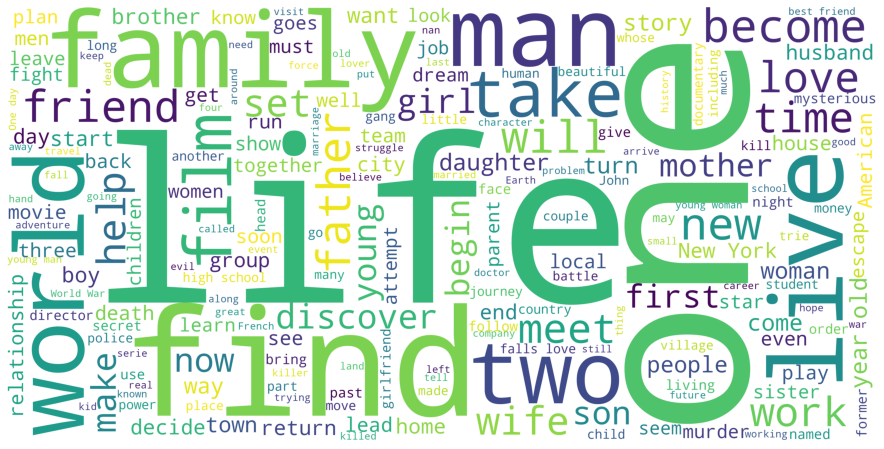

In [ ]:
overview_wordcloud = WordCloud(stopwords=STOPWORDS, background_color='white', height=2000, width=4000).generate(overview_corpus)
plt.figure(figsize=(16,8))
plt.imshow(overview_wordcloud)
plt.axis('off')
plt.show()

In [ ]:
df_emb['overview'][28]
df_emb['overview'] = df_emb['overview'].fillna('')

In [ ]:
from ast import literal_eval

In [ ]:
keyw.head(5) #what does it mean... 
#Contains Cast and Crew Information for all movies in the movies_metadata.csv file.

,id,keywords
0,862,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,..."
1,8844,"[{'id': 10090, 'name': 'board game'}, {'id': 1..."
2,15602,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392..."
3,31357,"[{'id': 818, 'name': 'based on novel'}, {'id':..."
4,11862,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n..."


In [ ]:
df['genres'] = df['genres'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])

In [ ]:
df.head(5)

,genres,id,overview,title
0,"[Animation, Comedy, Family]",862,"Led by Woody, Andy's toys live happily in his ...",Toy Story
1,"[Adventure, Fantasy, Family]",8844,When siblings Judy and Peter discover an encha...,Jumanji
2,"[Romance, Comedy]",15602,A family wedding reignites the ancient feud be...,Grumpier Old Men
3,"[Comedy, Drama, Romance]",31357,"Cheated on, mistreated and stepped on, the wom...",Waiting to Exhale
4,[Comedy],11862,Just when George Banks has recovered from his ...,Father of the Bride Part II


In [ ]:
keyw['keywords'] = keyw['keywords'].fillna('[]').apply(literal_eval).apply(lambda x: [i['name'] for i in x] if isinstance(x, list) else [])

In [ ]:
keyw.head(5)

,id,keywords
0,862,"[jealousy, toy, boy, friendship, friends, riva..."
1,8844,"[board game, disappearance, based on children'..."
2,15602,"[fishing, best friend, duringcreditsstinger, o..."
3,31357,"[based on novel, interracial relationship, sin..."
4,11862,"[baby, midlife crisis, confidence, aging, daug..."


In [ ]:
keyw['keywords'][1] #Произошло джуманджи

['board game',
 'disappearance',
 "based on children's book",
 'new home',
 'recluse',
 'giant insect']

In [ ]:
#df_emb['overview'] = df_emb['overview'].astype('str')
keyw['keywords'] = keyw['keywords'].astype('str')
keyw_corpus = ' '.join(keyw['keywords'])

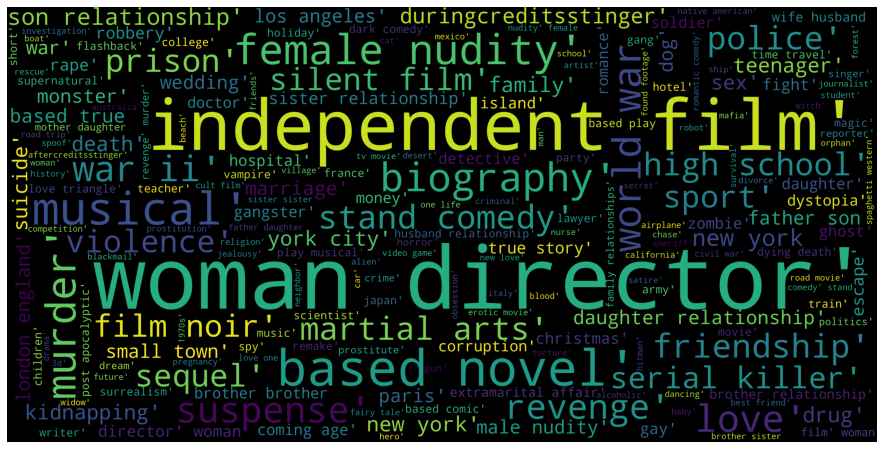

In [ ]:
keyw_wc = WordCloud(stopwords=STOPWORDS, height=2000, width=4000).generate(keyw_corpus)
plt.figure(figsize=(16,8))
plt.imshow(keyw_wc)
plt.axis('off')
plt.show()

#Мердж датасетов

In [ ]:
df = df.rename(columns={"title":"Title"})

In [ ]:
df_merged = pd.merge(df, df2, on="Title")

In [ ]:
final_df = df_merged.loc[:, df_merged.columns.intersection(['id', 'overview', 'Title', 'genres', 'Plot'])]

In [ ]:
final_df.head(5)

,genres,id,overview,Title,Plot
0,"[Animation, Comedy, Family]",862,"Led by Woody, Andy's toys live happily in his ...",Toy Story,In a world where toys are living things who pr...
1,"[Adventure, Fantasy, Family]",8844,When siblings Judy and Peter discover an encha...,Jumanji,"In 1869, near Brantford, New Hampshire, two br..."
2,"[Romance, Comedy]",15602,A family wedding reignites the ancient feud be...,Grumpier Old Men,The feud between Max (Walter Matthau) and John...
3,"[Comedy, Drama, Romance]",31357,"Cheated on, mistreated and stepped on, the wom...",Waiting to Exhale,"""Friends are the People who let you be yoursel..."
4,[Comedy],11862,Just when George Banks has recovered from his ...,Father of the Bride Part II,The film begins five years after the events of...


#Векторизуем


In [ ]:
model = Word2Vec(train, min_count=1, size = 300)

In [ ]:
model.save('wiki_1')
print(model)

Word2Vec(vocab=47751, size=300, alpha=0.025)


In [ ]:
words = list(model.wv.vocab)
print(words)

['world', 'toys', 'living', 'things', 'pretend', 'lifeless', 'humans', 'present', 'group', 'owned', 'six', 'year', 'old', 'andy', 'davis', 'caught', 'guard', 'birthday', 'party', 'moved', 'week', 'mother', 'infant', 'sister', 'molly', 'preparing', 'move', 'following', 'leader', 'favorite', 'toy', 'pull', 'string', 'cowboy', 'doll', 'named', 'sheriff', 'woody', 'organizes', 'including', 'bo', 'peep', 'shepherdess', 'mr', 'potato', 'head', 'rex', 'dinosaur', 'hamm', 'piggy', 'bank', 'slinky', 'dog', 'scouting', 'mission', 'green', 'army', 'men', 'led', 'sarge', 'spy', 'report', 'results', 'others', 'via', 'baby', 'monitors', 'relieved', 'appears', 'end', 'none', 'replaced', 'receives', 'surprise', 'gift', 'electronic', 'space', 'ranger', 'action', 'figure', 'buzz', 'lightyear', 'thinks', 'actual', 'impresses', 'various', 'features', 'begins', 'favor', 'making', 'feel', 'left', 'prepares', 'family', 'outing', 'pizza', 'planet', 'allows', 'bring', 'one', 'fearing', 'choose', 'attempts', 't

In [ ]:
model.most_similar('pain')

[('fit', 0.976874053478241),
 ('curse', 0.9753579497337341),
 ('merely', 0.9728171825408936),
 ('nose', 0.9725316762924194),
 ('silence', 0.9714415073394775),
 ('mesmerize', 0.9708386659622192),
 ('happening', 0.9701552987098694),
 ('intentionally', 0.9677451848983765),
 ('warning', 0.9675617814064026),
 ('malachai', 0.9668834209442139)]

In [ ]:
model.most_similar('mother')

[('sister', 0.9054920077323914),
 ('wife', 0.8956626057624817),
 ('husband', 0.8920164108276367),
 ('father', 0.8717134594917297),
 ('mary', 0.8704347610473633),
 ('chiding', 0.8649378418922424),
 ('daughter', 0.8638726472854614),
 ('freya', 0.8502208590507507),
 ('parents', 0.8478724956512451),
 ('beth', 0.8428220748901367)]

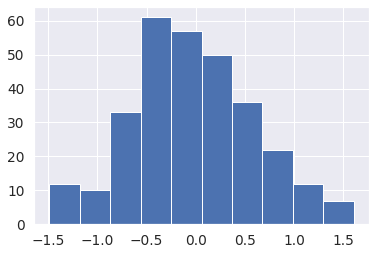

In [ ]:
plt.hist(model['king']);

In [ ]:
model_normed = {}
for idx, val in enumerate(model.wv.vocab):
  v = model[val]/np.linalg.norm(model[val])
  model_normed.update({val: v})

In [ ]:
model.wv.index2word[:20]

['one',
 'back',
 'two',
 'tells',
 'father',
 'home',
 'new',
 'house',
 'later',
 'man',
 'time',
 'finds',
 'find',
 'family',
 'police',
 'life',
 'night',
 'mother',
 'away',
 'also']

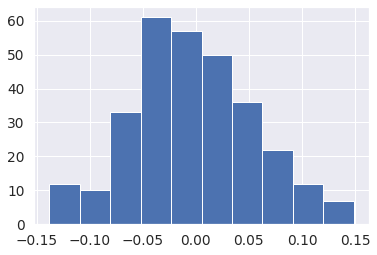

In [ ]:
plt.hist(model_normed['king']);

#T-SNE

Нужно доделать тсне с эмбеддингом, пока что вот так

In [ ]:
from sklearn.manifold import TSNE
import multiprocessing

In [ ]:
#model = Word2Vec(PlotVec, min_count=1, size=300)

In [ ]:
def display_closestwords_tsnescatterplot(model, word):
    
    arr = np.empty((0,300), dtype='f')
    word_labels = [word]

    # get close words
    close_words = model.similar_by_word(word)
    
    # add the vector for each of the closest words to the array
    arr = np.append(arr, np.array([model[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = model[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
    # find tsne coords for 2 dimensions
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    # display scatter plot
    plt.figure(figsize=(10, 10))
    plt.scatter(x_coords, y_coords)
    #colors = 'r', 'g', 'b', 'c', 'm', 'y', 'k', 'w', 'orange', 'purple'

    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
    plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
    #plt.legend()
    plt.show()

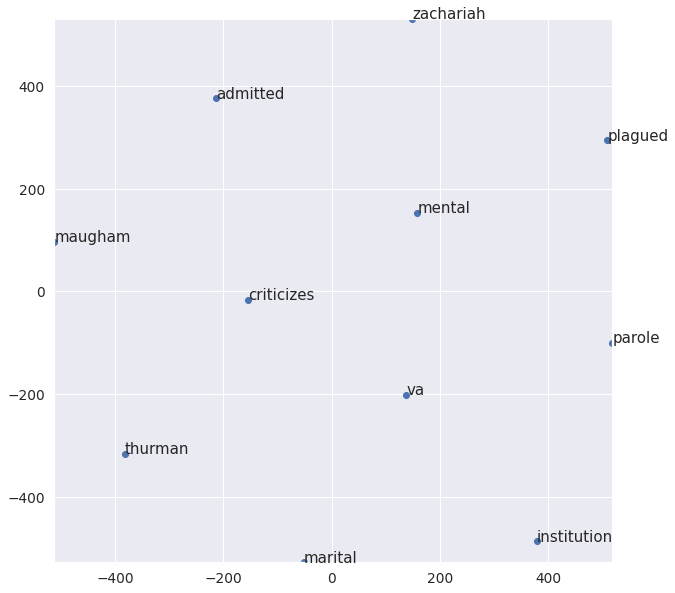

In [ ]:
display_closestwords_tsnescatterplot(model, 'mental')


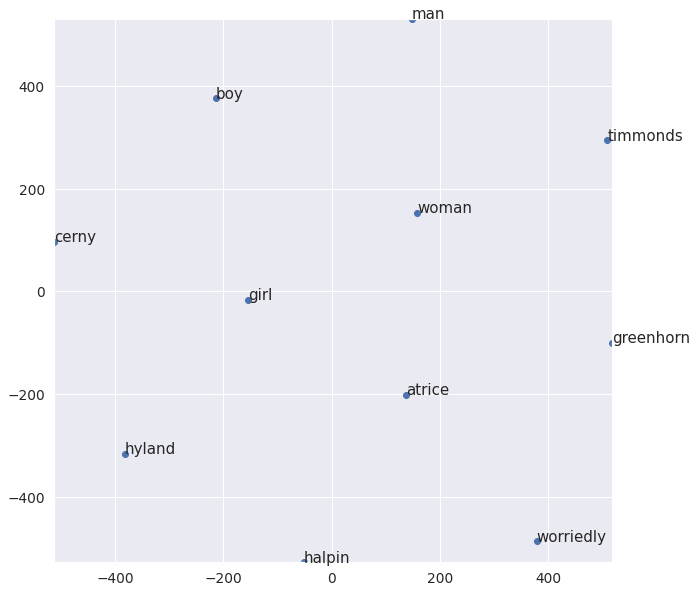

In [ ]:
display_closestwords_tsnescatterplot(model, 'woman')